In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files



import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans



print('Libraries imported.')

Libraries imported.


In [2]:
!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

Fetching package metadata .............
Solving package specifications: .

Package plan for installation in environment /home/nbuser/anaconda3_420:

The following NEW packages will be INSTALLED:

    _libgcc_mutex: 0.1-main           conda-forge
    geographiclib: 1.50-py_0          conda-forge
    geopy:         2.0.0-pyh9f0ad1d_0 conda-forge
    readline:      7.0-ha6073c6_4                

The following packages will be UPDATED:

    conda:         4.3.31-py35_0                  --> 4.5.11-py35_0        conda-forge
    pycosat:       0.6.1-py35_1                   --> 0.6.3-py35h470a237_1 conda-forge

The following packages will be SUPERSEDED by a higher-priority channel:

    conda-env:     2.6.0-h36134e3_1               --> 2.6.0-1              conda-forge

_libgcc_mutex- 100% |################################| Time: 0:00:00   1.83 MB/s
conda-env-2.6. 100% |################################| Time: 0:00:00   2.81 MB/s
readline-7.0-h 100% |################################| Time: 0:0

In [15]:
address = 'https://en.wikipedia.org/wiki/Community_areas_in_Chicago#List_of_community_areas'
url = requests.get(address).text

from bs4 import BeautifulSoup
soup = BeautifulSoup(url,'lxml')
print(soup.prettify())

<!DOCTYPE html>
<html class="client-nojs" dir="ltr" lang="en">
 <head>
  <meta charset="utf-8"/>
  <title>
   Community areas in Chicago - Wikipedia
  </title>
  <script>
   document.documentElement.className="client-js";RLCONF={"wgBreakFrames":!1,"wgSeparatorTransformTable":["",""],"wgDigitTransformTable":["",""],"wgDefaultDateFormat":"dmy","wgMonthNames":["","January","February","March","April","May","June","July","August","September","October","November","December"],"wgRequestId":"b0b6bcf8-4c33-4fb7-aea9-0f5e7ce7799c","wgCSPNonce":!1,"wgCanonicalNamespace":"","wgCanonicalSpecialPageName":!1,"wgNamespaceNumber":0,"wgPageName":"Community_areas_in_Chicago","wgTitle":"Community areas in Chicago","wgCurRevisionId":959672076,"wgRevisionId":959672076,"wgArticleId":1265165,"wgIsArticle":!0,"wgIsRedirect":!1,"wgAction":"view","wgUserName":null,"wgUserGroups":["*"],"wgCategories":["Articles with short description","Use mdy dates from October 2019","Articles containing potentially dated statem

In [16]:
My_table = soup.find('table', class_ ='wikitable')
My_table

<table class="wikitable sortable plainrowheaders">
<caption>Chicago community areas by number, population, and area
</caption>
<tbody><tr>
<th scope="col">Number<sup class="reference" id="cite_ref-City_basics_9-0"><a href="#cite_note-City_basics-9">[8]</a></sup>
</th>
<th scope="col">Name<sup class="reference" id="cite_ref-City_basics_9-1"><a href="#cite_note-City_basics-9">[8]</a></sup>
</th>
<th scope="col">2017<sup class="plainlinks noexcerpt noprint asof-tag update" style="display:none;"><a class="external text" href="https://en.wikipedia.org/w/index.php?title=Community_areas_in_Chicago&amp;action=edit">[update]</a></sup> population<sup class="reference" id="cite_ref-CMAP_Population_10-0"><a href="#cite_note-CMAP_Population-10">[9]</a></sup>
</th>
<th scope="col">Area (sq mi.)<sup class="reference" id="cite_ref-CMAP_Area_11-0"><a href="#cite_note-CMAP_Area-11">[10]</a></sup>
</th>
<th scope="col">Area (km<sup>2</sup>)
</th>
<th scope="col">2017<sup class="plainlinks noexcerpt nopri

In [17]:
name=[]
population=[]
area=[]
density=[]

rows=My_table.find_all('tr')
links=My_table.find_all('a')
for link in links:
    if link.get('title')!= None:
        name.append(link.get('title'))
for row in rows[1:78]:
    cells=row.find_all('td')
    population.append(cells[1].text.strip())
    area.append(cells[3].text.strip())
    density.append(cells[5].text.strip())
print(name)
print(population)
print(area)
print(density)

['Rogers Park, Chicago', 'West Ridge, Chicago', 'Uptown, Chicago', 'Lincoln Square, Chicago', 'North Center, Chicago', 'Lake View, Chicago', 'Lincoln Park, Chicago', 'Near North Side, Chicago', 'Edison Park, Chicago', 'Norwood Park, Chicago', 'Jefferson Park, Chicago', 'Forest Glen, Chicago', 'North Park, Chicago', 'Albany Park, Chicago', 'Portage Park, Chicago', 'Irving Park, Chicago', 'Dunning, Chicago', 'Montclare, Chicago', 'Belmont Cragin, Chicago', 'Hermosa, Chicago', 'Avondale, Chicago', 'Logan Square, Chicago', 'Humboldt Park, Chicago', 'West Town, Chicago', 'Austin, Chicago', 'West Garfield Park, Chicago', 'East Garfield Park, Chicago', 'Near West Side, Chicago', 'North Lawndale, Chicago', 'South Lawndale, Chicago', 'Lower West Side, Chicago', 'Chicago Loop', 'Near South Side, Chicago', 'Armour Square, Chicago', 'Douglas, Chicago', 'Oakland, Chicago', 'Fuller Park, Chicago', 'Grand Boulevard, Chicago', 'Kenwood, Chicago', 'Washington Park (community area), Chicago', 'Hyde Park

In [18]:
df1 = pd.DataFrame(columns =('Community','Density','Population'))
df1['Community']=name
df1['Population']=population
df1['Area']=area
df1['Density']=density
df1.head()

,Community,Density,Population,Area
0,"Rogers Park, Chicago","11,554.11","55,062",4.77
1,"West Ridge, Chicago","8,336.20","76,215",9.14
2,"Uptown, Chicago","9,648.06","57,973",6.01
3,"Lincoln Square, Chicago","6,291.50","41,715",6.63
4,"North Center, Chicago","6,740.59","35,789",5.31


In [19]:
df1.sort_values('Community',axis=0,inplace=True)
df1.head()

,Community,Density,Population,Area
13,"Albany Park, Chicago","10,455.33","51,992",4.97
56,"Archer Heights, Chicago","2,524.46","13,142",5.21
33,"Armour Square, Chicago","5,195.00","13,455",2.59
69,"Ashburn, Chicago","3,479.05","43,792",12.59
70,"Auburn Gresham, Chicago","4,739.53","46,278",9.76


In [20]:
df1=df1.reset_index(drop=True)
df1.head()

,Community,Density,Population,Area
0,"Albany Park, Chicago","10,455.33","51,992",4.97
1,"Archer Heights, Chicago","2,524.46","13,142",5.21
2,"Armour Square, Chicago","5,195.00","13,455",2.59
3,"Ashburn, Chicago","3,479.05","43,792",12.59
4,"Auburn Gresham, Chicago","4,739.53","46,278",9.76


In [21]:
df1.shape

(77, 4)

In [22]:
df1['Community']=df1['Community'].str.replace(', Chicago', '')
df1.head()

,Community,Density,Population,Area
0,Albany Park,"10,455.33","51,992",4.97
1,Archer Heights,"2,524.46","13,142",5.21
2,Armour Square,"5,195.00","13,455",2.59
3,Ashburn,"3,479.05","43,792",12.59
4,Auburn Gresham,"4,739.53","46,278",9.76


In [23]:
res = requests.get('https://en.wikipedia.org/wiki/Community_areas_in_Chicago').content
result = {}
soup = BeautifulSoup(res,'lxml')
tables = soup.find_all('table',{'class':'wikitable'})
table = tables[0].find('tbody')
districtLinks = table.find_all('a',href=True)

for link in districtLinks:
    if link.getText() in link.attrs.get('title','') or link.attrs.get('title','') in link.getText():
        district = link.attrs.get('title','')
        if district:
            url = link.attrs.get('href', '')
        else:
            continue
    else:
        continue
    try:
        res = requests.get("https://en.wikipedia.org/{}".format(url))
    except:
        continue
    else:
        soup = BeautifulSoup(res.content, 'lxml')
        try:
            tables = soup.find_all('table',{'class':'infobox geography vcard'})
            table = tables[0].find('tbody')
        except:
            continue
        else:
            for row in table.find_all('tr',{'class':'mergedbottomrow'}):
                geoLink = row.find('span',{'class': 'geo'}) # 'plainlinks nourlexpansion'
                locationSplit = geoLink.getText().split("; ")
                result.update({district : {"Latitude": locationSplit[0], "Longitude":locationSplit[1]}})

print(result)

{'Roseland, Chicago': {'Latitude': '41.7100', 'Longitude': '-87.6200'}, 'Lincoln Park, Chicago': {'Latitude': '41.9200', 'Longitude': '-87.650'}, 'Jefferson Park, Chicago': {'Latitude': '41.9800', 'Longitude': '-87.7700'}, 'Montclare, Chicago': {'Latitude': '41.9300', 'Longitude': '-87.800'}, 'West Garfield Park, Chicago': {'Latitude': '41.8800', 'Longitude': '-87.7300'}, 'Ashburn, Chicago': {'Latitude': '41.7500', 'Longitude': '-87.7100'}, 'Avondale, Chicago': {'Latitude': '41.9400', 'Longitude': '-87.7100'}, 'West Lawn, Chicago': {'Latitude': '41.7700', 'Longitude': '-87.7200'}, 'Morgan Park, Chicago': {'Latitude': '41.6900', 'Longitude': '-87.6700'}, 'South Lawndale, Chicago': {'Latitude': '41.8500', 'Longitude': '-87.7100'}, 'South Chicago, Chicago': {'Latitude': '41.7400', 'Longitude': '-87.550'}, 'Hermosa, Chicago': {'Latitude': '41.9200', 'Longitude': '-87.7300'}, 'Edison Park, Chicago': {'Latitude': '42.0100', 'Longitude': '-87.8100'}, 'Douglas, Chicago': {'Latitude': '41.83472

In [24]:
coordinates=pd.DataFrame.from_dict(result,orient='index')
coordinates.head()

,Latitude,Longitude
"Albany Park, Chicago",41.9700,-87.7200
"Archer Heights, Chicago",41.8100,-87.7300
"Armour Square, Chicago",41.8333,-87.6333
"Ashburn, Chicago",41.7500,-87.7100
"Auburn Gresham, Chicago",41.7400,-87.6600


In [25]:
coordinates.reset_index(inplace=True)
coordinates.head()

,index,Latitude,Longitude
0,"Albany Park, Chicago",41.9700,-87.7200
1,"Archer Heights, Chicago",41.8100,-87.7300
2,"Armour Square, Chicago",41.8333,-87.6333
3,"Ashburn, Chicago",41.7500,-87.7100
4,"Auburn Gresham, Chicago",41.7400,-87.6600


In [26]:
coordinates.rename(columns={'index':'Community'}, inplace=True)
coordinates['Community']=coordinates['Community'].str.replace(', Chicago', '')
coordinates.head()

,Community,Latitude,Longitude
0,Albany Park,41.9700,-87.7200
1,Archer Heights,41.8100,-87.7300
2,Armour Square,41.8333,-87.6333
3,Ashburn,41.7500,-87.7100
4,Auburn Gresham,41.7400,-87.6600


In [27]:
coordinates.shape

(77, 3)

In [28]:
dfinal = df1.merge(coordinates, on="Community", how = 'inner')
dfinal.head()

,Community,Density,Population,Area,Latitude,Longitude
0,Albany Park,"10,455.33","51,992",4.97,41.9700,-87.7200
1,Archer Heights,"2,524.46","13,142",5.21,41.8100,-87.7300
2,Armour Square,"5,195.00","13,455",2.59,41.8333,-87.6333
3,Ashburn,"3,479.05","43,792",12.59,41.7500,-87.7100
4,Auburn Gresham,"4,739.53","46,278",9.76,41.7400,-87.6600


In [29]:
dfinal.shape

(77, 6)

In [30]:
dfinal=dfinal.set_index('Community')
dfinal.rename(index={'Washington Park (community area)': 'Washington Park','Chicago Loop':'Loop'}, inplace=True)
dfinal.reset_index(inplace=True)
dfinal

,Community,Density,Population,Area,Latitude,Longitude
0,Albany Park,"10,455.33","51,992",4.97,41.9700,-87.7200
1,Archer Heights,"2,524.46","13,142",5.21,41.8100,-87.7300
2,Armour Square,"5,195.00","13,455",2.59,41.8333,-87.6333
3,Ashburn,"3,479.05","43,792",12.59,41.7500,-87.7100
4,Auburn Gresham,"4,739.53","46,278",9.76,41.7400,-87.6600
5,Austin,"5,144.07","95,260",18.52,41.900,-87.7600
6,Avalon Park,"3,084.18","9,985",3.24,41.750,-87.5900
7,Avondale,"7,286.80","37,368",5.13,41.9400,-87.7100
8,Belmont Cragin,"7,890.90","79,910",10.13,41.9300,-87.7600
9,Beverly,"2,528.12","20,822",8.24,41.7100,-87.6800


In [31]:
dfinal.sort_values('Community',axis=0,inplace=True)
dfinal=dfinal.reset_index(drop=True)
dfinal

,Community,Density,Population,Area,Latitude,Longitude
0,Albany Park,"10,455.33","51,992",4.97,41.9700,-87.7200
1,Archer Heights,"2,524.46","13,142",5.21,41.8100,-87.7300
2,Armour Square,"5,195.00","13,455",2.59,41.8333,-87.6333
3,Ashburn,"3,479.05","43,792",12.59,41.7500,-87.7100
4,Auburn Gresham,"4,739.53","46,278",9.76,41.7400,-87.6600
5,Austin,"5,144.07","95,260",18.52,41.900,-87.7600
6,Avalon Park,"3,084.18","9,985",3.24,41.750,-87.5900
7,Avondale,"7,286.80","37,368",5.13,41.9400,-87.7100
8,Belmont Cragin,"7,890.90","79,910",10.13,41.9300,-87.7600
9,Beverly,"2,528.12","20,822",8.24,41.7100,-87.6800


In [32]:
dfinal.dtypes

Community     object
Density       object
Population    object
Area          object
Latitude      object
Longitude     object
dtype: object

In [33]:
dfinal['Density']=dfinal['Density'].replace(",","", regex=True).astype(float)
dfinal['Population']=dfinal['Population'].replace(",","", regex=True).astype(int)
dfinal['Area']=dfinal['Area'].astype(float)
dfinal['Latitude']=dfinal['Latitude'].astype(float)
dfinal['Longitude']=dfinal['Longitude'].astype(float)
dfinal.dtypes

Community      object
Density       float64
Population      int64
Area          float64
Latitude      float64
Longitude     float64
dtype: object

In [34]:
df_demo=pd.read_csv('https://datahub.cmap.illinois.gov/dataset/1d2dd970-f0a6-4736-96a1-3caeb431f5e4/resource/8c4e096e-c90c-4bef-9cf1-9028d094296e/download/ReferenceCCAProfiles20132017.csv')
df_demo.head()

,GEOG,2000_POP,2010_POP,TOT_POP,UND19,A20_34,A35_49,A50_64,A65_74,A75_84,OV85,MED_AGE,WHITE,HISP,BLACK,ASIAN,OTHER,POP_HH,POP_16OV,IN_LBFRC,EMP,UNEMP,NOT_IN_LBFRC,WORK_AT_HOME,TOT_COMM,DROVE_AL,CARPOOL,TRANSIT,WALK_BIKE,COMM_OTHER,AGG_TT,NO_VEH,ONE_VEH,TWO_VEH,THREEOM_VEH,POP_25OV,LT_HS,HS,SOME_COLL,ASSOC,BACH,GRAD_PROF,INC_LT_25K,INC_25_50K,INC_50_75K,INC_75_100K,INC_100_150K,INC_GT_150,MEDINC,TOT_HH,OWN_OCC_HU,RENT_OCC_HU,VAC_HU,HU_TOT,HU_SNG_DET,HU_SNG_ATT,HU_2UN,HU_3_4UN,HU_GT_5UN,MED_ROOMS,HA_AFT2000,HA_70_00,HA_40_70,HA_BEF1940,MED_HA,BR_0_1,BR_2,BR_3,BR_4,BR_5,HV_LT_150K,HV_150_300K,HV_300_500K,HV_GT_500K,MED_HV,TOT_EMP_RES,RES_NAICS1_TYPE,RES_NAICS2_TYPE,RES_NAICS3_TYPE,RES_NAICS4_TYPE,RES_NAICS5_TYPE,RES_NAICS1_COUNT,RES_NAICS2_COUNT,RES_NAICS3_COUNT,RES_NAICS4_COUNT,RES_NAICS5_COUNT,TOT_EMP_WORK,WORK_NAICS1_TYPE,WORK_NAICS2_TYPE,WORK_NAICS3_TYPE,WORK_NAICS4_TYPE,WORK_NAICS5_TYPE,WORK_NAICS1_COUNT,WORK_NAICS2_COUNT,WORK_NAICS3_COUNT,WORK_NAICS4_COUNT,WORK_NAICS5_COUNT,RES_CITY1_TYPE,RES_CITY2_TYPE,RES_CITY3_TYPE,RES_CITY4_TYPE,RES_CITY5_TYPE,RES_CITY1_COUNT,RES_CITY2_COUNT,RES_CITY3_COUNT,RES_CITY4_COUNT,RES_CITY5_COUNT,WORK_CITY1_TYPE,WORK_CITY2_TYPE,WORK_CITY3_TYPE,WORK_CITY4_TYPE,WORK_CITY5_TYPE,WORK_CITY1_COUNT,WORK_CITY2_COUNT,WORK_CITY3_COUNT,WORK_CITY4_COUNT,WORK_CITY5_COUNT,IDES_START_EMP,IDES_MID_EMP,IDES_CURR_EMP,AVG_VMT,RET_SALES,GEN_MERCH,RES_EAV,CMRCL_EAV,IND_EAV,RAIL_EAV,FARM_EAV,MIN_EAV,TOT_EAV,WALKSCORE,OPEN_SPACE_PER_1000,TOT_ACRES,SF,Sfperc,MF,Mfperc,MIX,MIXperc,COMM,COMMperc,INST,INSTperc,IND,INDperc,TRANS,TRANSperc,AG,Agperc,OPEN,OPENperc,VACANT,VACperc,CT_1PHH,CT_2PHH,CT_3PHH,CT_4MPHH,CT_FAM_HH,CT_SP_WCHILD,CT_NONFAM_HH,HCUND20K,HCUND20K_LT20PCT,HCUND20K_20_29PCT,HCUND20K_30MPCT,HC20Kto49K,HC20Kto49K_LT20PCT,HC20Kto49K_20_29PCT,HC20Kto49K_30MPCT,HC50Kto75K,HC50Kto75K_LT20PCT,HC50Kto75K_20_29PCT,HC50Kto75K_30MPCT,HCOV75K,HCOV75K_LT20PCT,HCOV75K_20_29PCT,HCOV75K_30MPCT,NATIVE,FOR_BORN,POP_OV5,ONLY_ENGLISH,NOT_ENGLISH,LING_ISO,ENGLISH,SPANISH,SLAVIC,CHINESE,TAGALOG,ARABIC,KOREAN,OTHER_ASIAN,OTHER_EURO,OTHER_UNSPEC,2000_WHITE,2000_HISP,2000_BLACK,2000_ASIAN,2000_OTHER,2000_UND19,2000_A20_34,2000_A35_49,2000_A50_64,2000_OV65,2000_MED_AGE,2000_TOT_HH,2000_OWN_OCC_HU,2000_RENT_OCC_HU,2000_VAC_HU,2000_HU_TOT,2000_LT_HS,2000_HS,2000_SOME_COLL,2000_ASSOC,2000_BACH,2000_GRAD_PROF,2000_POP_25OV,HT_Cost_Typical,HT_Cost_Mod,H_Cost_Typical,H_Cost_Mod,T_Cost_Typical,T_Cost_Mod
0,Albany Park,57655,51542,50342.99998,12924.999990,12891.999990,11619.999990,8083.999996,2716.999999,1491.999999,613.000000,34.300953,16126.999990,22985.999990,2501.999998,7202.999996,1524.999999,48785.00001,39793.999970,27977.999980,26352.999980,1570.999999,11815.999990,1060.000000,24865.999980,13287.999990,2063.999998,7723.999996,1530.999999,259.000000,302784.99970,3373.999997,7848.999994,4077.999999,1376.999999,33611.999980,7196.999997,8191.999996,4568.999997,1824.999999,7768.999996,4059.999998,3319.000001,3668.000001,3056.000001,2124.000001,2522.000001,1989.000001,59883.04094,16678.000000,6867.999998,9809.999999,1769.000000,18447.000000,3682.999999,216.000000,3554.999999,3710.999999,7269.999999,5.354400,815.000000,1593.000000,2912.000000,13127.000000,1786.762779,4254.000000,7381.999998,4646.999999,1682.999999,481.000000,776.000000,2621.000001,2533.000001,851.000000,299732.7303,18067,Health Care,Accommodation and Food Service,Retail Trade,Professional,Education,2509,2117,1957,1689,1442,5366,Health Care,Retail Trade,Manufacturing,Information,Administration,1014,897,837,515,440,Outside of Chicago,The Loop,Near North Side,Near West Side,Albany Park,7132,2825,1643,785,533,Outside of Chicago,Albany Park,Irving Park,West Ridge,Portage Park,2484,533,186,155,154,NaN,NaN,NaN,11783.649450,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.660925,1229.160488,302.877259,0.246410,295.528239,0.240431,34.52091519,0.028084954,75.040162,0.061050,53.804265,0.043773,20.18811455,0.016424311,413.623654,0.336509,n/a,n/a,28.102925,0.022864,5.474954,0.004454,4227.000001

In [35]:
df_demo=df_demo[['GEOG','A20_34','A35_49','A50_64','MEDINC','WORK_AT_HOME','WALK_BIKE','TOT_COMM','DROVE_AL','CARPOOL','TRANSIT','COMM_OTHER','CT_FAM_HH','CT_SP_WCHILD','CT_NONFAM_HH','LT_HS', 'HS','SOME_COLL', 'ASSOC', 'BACH', 'GRAD_PROF','OWN_OCC_HU','RENT_OCC_HU', 'TOT_HH','VAC_HU','HU_SNG_DET', 'HU_SNG_ATT', 'HU_2UN', 'HU_3_4UN', 'HU_GT_5UN']]
df_demo.head()

,GEOG,A20_34,A35_49,A50_64,MEDINC,WORK_AT_HOME,WALK_BIKE,TOT_COMM,DROVE_AL,CARPOOL,TRANSIT,COMM_OTHER,CT_FAM_HH,CT_SP_WCHILD,CT_NONFAM_HH,LT_HS,HS,SOME_COLL,ASSOC,BACH,GRAD_PROF,OWN_OCC_HU,RENT_OCC_HU,TOT_HH,VAC_HU,HU_SNG_DET,HU_SNG_ATT,HU_2UN,HU_3_4UN,HU_GT_5UN
0,Albany Park,12891.999990,11619.999990,8083.999996,59883.04094,1060.000000,1530.999999,24865.999980,13287.999990,2063.999998,7723.999996,259.000000,10635.000000,1567.000000,6043.000001,7196.999997,8191.999996,4568.999997,1824.999999,7768.999996,4059.999998,6867.999998,9809.999999,16678.000000,1769.000000,3682.999999,216.000000,3554.999999,3710.999999,7269.999999
1,Archer Heights,2753.618290,2815.956263,1672.978132,44108.84007,109.585703,260.512591,5514.716488,3633.225019,528.891145,1045.221770,46.865963,2917.580356,469.383928,1012.406249,2263.838967,2989.584493,1330.580517,298.284294,857.065607,248.284294,2239.008347,1691.367431,3929.986605,427.705357,2064.334026,81.749478,1006.597077,1032.557410,172.862213
2,Armour Square,2788.930936,2297.106212,2520.154383,27463.83031,98.791095,1168.964751,5496.318373,1974.053434,1094.434510,1157.672729,101.192950,3428.403671,253.009174,2039.500000,3849.277425,2933.860710,936.182821,359.867092,1534.230993,830.492746,2054.822284,3411.770095,5467.903671,356.077982,488.008462,599.401975,873.442876,1184.765866,2648.967558
3,Ashburn,8464.999998,9192.999998,8529.999996,68463.73500,383.000000,41.000000,18809.000000,13674.000000,2205.000000,2731.000000,158.000000,10210.000000,1449.999999,2869.999999,4229.999999,8655.999997,6269.000000,2739.999998,3596.999999,2054.999999,10843.000010,2237.000001,13080.000000,648.000000,11985.000010,194.000001,337.999999,622.000000,589.000000
4,Auburn Gresham,8665.000001,7891.000000,9595.000003,34661.22650,752.000000,78.000000,15215.000010,9765.000005,1291.000001,3904.000004,177.000000,10307.999990,2265.999999,6658.999995,4925.000001,9742.000001,9530.000003,2382.000000,2974.000001,1625.000000,7606.999998,9359.999999,16966.999990,3758.999999,9124.999997,348.000000,3689.000000,3035.000000,4495.000000


In [36]:
df_demo.shape

(77, 30)

In [37]:
df_demo=df_demo.set_index('GEOG')
df_demo.rename(index={'The Loop':'Loop'}, inplace=True)
df_demo.reset_index(inplace=True)
df_demo.head()

,GEOG,A20_34,A35_49,A50_64,MEDINC,WORK_AT_HOME,WALK_BIKE,TOT_COMM,DROVE_AL,CARPOOL,TRANSIT,COMM_OTHER,CT_FAM_HH,CT_SP_WCHILD,CT_NONFAM_HH,LT_HS,HS,SOME_COLL,ASSOC,BACH,GRAD_PROF,OWN_OCC_HU,RENT_OCC_HU,TOT_HH,VAC_HU,HU_SNG_DET,HU_SNG_ATT,HU_2UN,HU_3_4UN,HU_GT_5UN
0,Albany Park,12891.999990,11619.999990,8083.999996,59883.04094,1060.000000,1530.999999,24865.999980,13287.999990,2063.999998,7723.999996,259.000000,10635.000000,1567.000000,6043.000001,7196.999997,8191.999996,4568.999997,1824.999999,7768.999996,4059.999998,6867.999998,9809.999999,16678.000000,1769.000000,3682.999999,216.000000,3554.999999,3710.999999,7269.999999
1,Archer Heights,2753.618290,2815.956263,1672.978132,44108.84007,109.585703,260.512591,5514.716488,3633.225019,528.891145,1045.221770,46.865963,2917.580356,469.383928,1012.406249,2263.838967,2989.584493,1330.580517,298.284294,857.065607,248.284294,2239.008347,1691.367431,3929.986605,427.705357,2064.334026,81.749478,1006.597077,1032.557410,172.862213
2,Armour Square,2788.930936,2297.106212,2520.154383,27463.83031,98.791095,1168.964751,5496.318373,1974.053434,1094.434510,1157.672729,101.192950,3428.403671,253.009174,2039.500000,3849.277425,2933.860710,936.182821,359.867092,1534.230993,830.492746,2054.822284,3411.770095,5467.903671,356.077982,488.008462,599.401975,873.442876,1184.765866,2648.967558
3,Ashburn,8464.999998,9192.999998,8529.999996,68463.73500,383.000000,41.000000,18809.000000,13674.000000,2205.000000,2731.000000,158.000000,10210.000000,1449.999999,2869.999999,4229.999999,8655.999997,6269.000000,2739.999998,3596.999999,2054.999999,10843.000010,2237.000001,13080.000000,648.000000,11985.000010,194.000001,337.999999,622.000000,589.000000
4,Auburn Gresham,8665.000001,7891.000000,9595.000003,34661.22650,752.000000,78.000000,15215.000010,9765.000005,1291.000001,3904.000004,177.000000,10307.999990,2265.999999,6658.999995,4925.000001,9742.000001,9530.000003,2382.000000,2974.000001,1625.000000,7606.999998,9359.999999,16966.999990,3758.999999,9124.999997,348.000000,3689.000000,3035.000000,4495.000000


In [38]:
df_demo.sort_values('GEOG',axis=0,inplace=True)
df_demo=df_demo.reset_index(drop=True)
df_demo

,GEOG,A20_34,A35_49,A50_64,MEDINC,WORK_AT_HOME,WALK_BIKE,TOT_COMM,DROVE_AL,CARPOOL,TRANSIT,COMM_OTHER,CT_FAM_HH,CT_SP_WCHILD,CT_NONFAM_HH,LT_HS,HS,SOME_COLL,ASSOC,BACH,GRAD_PROF,OWN_OCC_HU,RENT_OCC_HU,TOT_HH,VAC_HU,HU_SNG_DET,HU_SNG_ATT,HU_2UN,HU_3_4UN,HU_GT_5UN
0,Albany Park,12891.999990,11619.999990,8083.999996,59883.04094,1060.000000,1530.999999,24865.999980,13287.999990,2063.999998,7723.999996,259.000000,10635.000000,1567.000000,6043.000001,7196.999997,8191.999996,4568.999997,1824.999999,7768.999996,4059.999998,6867.999998,9809.999999,16678.000000,1769.000000,3682.999999,216.000000,3554.999999,3710.999999,7269.999999
1,Archer Heights,2753.618290,2815.956263,1672.978132,44108.84007,109.585703,260.512591,5514.716488,3633.225019,528.891145,1045.221770,46.865963,2917.580356,469.383928,1012.406249,2263.838967,2989.584493,1330.580517,298.284294,857.065607,248.284294,2239.008347,1691.367431,3929.986605,427.705357,2064.334026,81.749478,1006.597077,1032.557410,172.862213
2,Armour Square,2788.930936,2297.106212,2520.154383,27463.83031,98.791095,1168.964751,5496.318373,1974.053434,1094.434510,1157.672729,101.192950,3428.403671,253.009174,2039.500000,3849.277425,2933.860710,936.182821,359.867092,1534.230993,830.492746,2054.822284,3411.770095,5467.903671,356.077982,488.008462,599.401975,873.442876,1184.765866,2648.967558
3,Ashburn,8464.999998,9192.999998,8529.999996,68463.73500,383.000000,41.000000,18809.000000,13674.000000,2205.000000,2731.000000,158.000000,10210.000000,1449.999999,2869.999999,4229.999999,8655.999997,6269.000000,2739.999998,3596.999999,2054.999999,10843.000010,2237.000001,13080.000000,648.000000,11985.000010,194.000001,337.999999,622.000000,589.000000
4,Auburn Gresham,8665.000001,7891.000000,9595.000003,34661.22650,752.000000,78.000000,15215.000010,9765.000005,1291.000001,3904.000004,177.000000,10307.999990,2265.999999,6658.999995,4925.000001,9742.000001,9530.000003,2382.000000,2974.000001,1625.000000,7606.999998,9359.999999,16966.999990,3758.999999,9124.999997,348.000000,3689.000000,3035.000000,4495.000000
5,Austin,21226.000000,17324.000000,17887.000000,33419.90397,1104.000000,897.000001,34302.000010,20078.000000,2475.000001,10295.000010,557.000000,20177.000000,5350.000000,12045.000000,12477.000000,21745.000010,14319.000000,4409.000001,5617.000001,3108.000000,13204.000000,19018.000000,32222.000000,5483.000000,9727.000001,736.000000,11782.000000,6672.999998,8630.000000
6,Avalon Park,1546.660391,1592.811747,2228.753012,43372.93830,184.166513,8.000000,3232.840471,2298.087506,340.845508,548.963773,36.943683,2108.555556,386.089669,1775.302144,892.743223,1799.090361,1916.341114,424.798946,1159.062500,668.882530,2581.733105,1300.046795,3883.857700,622.746589,2669.949743,238.107453,319.000000,499.689774,777.558061
7,Avondale,12371.000000,8155.999998,4962.999999,60000.00000,1043.000000,1010.000000,19447.000000,9845.999999,2061.000000,6166.000000,364.000000,7748.999996,1085.999999,5638.999997,5699.999999,5828.999998,4137.999999,1474.000000,6039.999997,3260.999999,5288.999999,8099.000001,13387.999990,1877.999999,2551.000000,405.000000,4696.000001,4305.000001,3294.000000
8,Belmont Cragin,17002.334200,18380.592610,13768.636230,50767.45194,685.667319,1452.059815,36970.790590,24104.285090,4714.338558,5683.656770,1016.450354,17069.560140,3532.213059,5399.794961,16612.350830,16239.617750,8238.886137,2874.899445,4727.026987,1962.902773,11459.854690,11010.215290,22469.355100,2187.943872,9628.727668,504.741658,5983.708289,5278.835308,3183.086114
9,Beverly,2830.000001,4144.000001,4992.000001,98415.94828,460.000001,188.000000,9496.000011,6666.000007,578.000001,1978.000003,86.000000,5254.000001,312.000000,2303.000000,529.000000,1896.000000,2600.000001,1233.000000,4000.000001,3986.000001,6242.000000,1315.000000,7557.000000,486.000000,6248.000000,107.000000,353.000000,287.000000,1027.000000


In [39]:
df_sum=pd.DataFrame({'Community':df_demo['GEOG'],'Median Income':df_demo['MEDINC']})
df_sum['Active Group']=df_demo[['A20_34','A35_49','A50_64']].sum(axis=1)
df_sum['Close to Work']=df_demo[['WORK_AT_HOME','WALK_BIKE']].sum(axis=1).div(df_demo[['WORK_AT_HOME','WALK_BIKE','TOT_COMM','DROVE_AL','CARPOOL','TRANSIT','COMM_OTHER']].sum(axis=1),axis=0)
df_sum['Non Family']=df_demo['CT_NONFAM_HH'].div(df_demo[['CT_FAM_HH','CT_SP_WCHILD','CT_NONFAM_HH']].sum(axis=1))
df_sum['Higher Edu']=df_demo[['SOME_COLL','ASSOC','BACH','GRAD_PROF']].sum(axis=1).div(df_demo[['LT_HS','HS','SOME_COLL','ASSOC','BACH','GRAD_PROF']].sum(axis=1),axis=0)
df_sum['Renter']=df_demo[['RENT_OCC_HU']].div(df_demo[['OWN_OCC_HU','RENT_OCC_HU','TOT_HH','VAC_HU']].sum(axis=1),axis=0)
df_sum['More Units']=df_demo[['HU_GT_5UN']].div(df_demo[['HU_SNG_DET','HU_SNG_ATT','HU_2UN','HU_3_4UN','HU_GT_5UN']].sum(axis=1),axis=0)
df_sum.head()

,Community,Median Income,Active Group,Close to Work,Non Family,Higher Edu,Renter,More Units
0,Albany Park,59883.04094,32595.999976,0.051012,0.331214,0.542158,0.279288,0.394359
1,Archer Heights,44108.84007,7242.552685,0.033225,0.230125,0.342306,0.204073,0.039665
2,Armour Square,27463.83031,7606.191531,0.114301,0.356499,0.350517,0.302179,0.457145
3,Ashburn,68463.73500,26187.999992,0.011158,0.197522,0.532218,0.083445,0.042905
4,Auburn Gresham,34661.22650,26151.000004,0.026618,0.346228,0.529572,0.248322,0.217234


In [40]:
df_sum

,Community,Median Income,Active Group,Close to Work,Non Family,Higher Edu,Renter,More Units
0,Albany Park,59883.04094,32595.999976,0.051012,0.331214,0.542158,0.279288,0.394359
1,Archer Heights,44108.84007,7242.552685,0.033225,0.230125,0.342306,0.204073,0.039665
2,Armour Square,27463.83031,7606.191531,0.114301,0.356499,0.350517,0.302179,0.457145
3,Ashburn,68463.73500,26187.999992,0.011158,0.197522,0.532218,0.083445,0.042905
4,Auburn Gresham,34661.22650,26151.000004,0.026618,0.346228,0.529572,0.248322,0.217234
5,Austin,33419.90397,56437.000000,0.028705,0.320584,0.445124,0.271969,0.229839
6,Avalon Park,43372.93830,5368.225150,0.028898,0.415767,0.607657,0.154982,0.172626
7,Avondale,60000.00000,25489.999997,0.051406,0.389595,0.563989,0.282648,0.215986
8,Belmont Cragin,50767.45194,49151.563040,0.028645,0.207672,0.351465,0.233627,0.129504
9,Beverly,98415.94828,11966.000003,0.033313,0.292667,0.829753,0.084295,0.128023


In [41]:
dfinal['Active_Density']=df_sum['Active Group'].div(dfinal['Area'],axis=0)
dfinal.head()

,Community,Density,Population,Area,Latitude,Longitude,Active_Density
0,Albany Park,10455.33,51992,4.97,41.9700,-87.7200,6558.551303
1,Archer Heights,2524.46,13142,5.21,41.8100,-87.7300,1390.125275
2,Armour Square,5195.00,13455,2.59,41.8333,-87.6333,2936.753487
3,Ashburn,3479.05,43792,12.59,41.7500,-87.7100,2080.063542
4,Auburn Gresham,4739.53,46278,9.76,41.7400,-87.6600,2679.405738


In [42]:
dfinal

,Community,Density,Population,Area,Latitude,Longitude,Active_Density
0,Albany Park,10455.33,51992,4.97,41.97000,-87.72000,6558.551303
1,Archer Heights,2524.46,13142,5.21,41.81000,-87.73000,1390.125275
2,Armour Square,5195.00,13455,2.59,41.83330,-87.63330,2936.753487
3,Ashburn,3479.05,43792,12.59,41.75000,-87.71000,2080.063542
4,Auburn Gresham,4739.53,46278,9.76,41.74000,-87.66000,2679.405738
5,Austin,5144.07,95260,18.52,41.90000,-87.76000,3047.354212
6,Avalon Park,3084.18,9985,3.24,41.75000,-87.59000,1656.859614
7,Avondale,7286.80,37368,5.13,41.94000,-87.71000,4968.810916
8,Belmont Cragin,7890.90,79910,10.13,41.93000,-87.76000,4852.079273
9,Beverly,2528.12,20822,8.24,41.71000,-87.68000,1452.184466


In [43]:

geolocator = Nominatim(user_agent="ca_explorer")
location = geolocator.geocode('Chicago, IL')
c_latitude = location.latitude
c_longitude = location.longitude
chicago_center=[c_latitude,c_longitude]
print('The geograpical coordinate of Chicago are {}, {}.'.format(c_latitude, c_longitude))

The geograpical coordinate of Chicago are 41.8755616, -87.6244212.


In [44]:
# create map of Chicago using latitude and longitude values
map_chicago = folium.Map(location=[c_latitude, c_longitude], zoom_start=10)

# add markers to map
for lat, lng, neighborhood in zip(dfinal['Latitude'], dfinal['Longitude'], dfinal['Community']):
    label = '{}'.format(neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_chicago)  
    
map_chicago

In [45]:
CLIENT_ID = 'LTKQ2FITMS2AE3303KEVR3P0XVGS3HNVRK3BOLR0A2EAFAWY' # Foursquare ID
CLIENT_SECRET = 'RZ0SQG2SGI0OTOXIKKX1VOJ3AZX4OO4O4KHUUPAAZHKRTYPZ' # Foursquare Secret
VERSION = '20180605' # Foursquare API version


print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: LTKQ2FITMS2AE3303KEVR3P0XVGS3HNVRK3BOLR0A2EAFAWY
CLIENT_SECRET:RZ0SQG2SGI0OTOXIKKX1VOJ3AZX4OO4O4KHUUPAAZHKRTYPZ


In [46]:
Categories='4bf58dd8d48988d175941735'
radius=2500
LIMIT=100

def getNearbyVenues(names, latitudes, longitudes, radius):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng,
            Categories,
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()['response']['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood',
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [48]:
chicago_venues = getNearbyVenues(names=coordinates['Community'],
                                   latitudes=coordinates['Latitude'],
                                   longitudes=coordinates['Longitude'],
                                   radius=2500,
                                  )

Albany Park
Archer Heights
Armour Square
Ashburn
Auburn Gresham
Austin
Avalon Park
Avondale
Belmont Cragin
Beverly
Bridgeport
Brighton Park
Burnside
Calumet Heights
Chatham
Chicago Lawn
Chicago Loop
Clearing
Douglas
Dunning
East Garfield Park
East Side
Edgewater
Edison Park
Englewood
Forest Glen
Fuller Park
Gage Park
Garfield Ridge
Grand Boulevard
Greater Grand Crossing
Hegewisch
Hermosa
Humboldt Park
Hyde Park
Irving Park
Jefferson Park
Kenwood
Lake View
Lincoln Park
Lincoln Square
Logan Square
Lower West Side
McKinley Park
Montclare
Morgan Park
Mount Greenwood
Near North Side
Near South Side
Near West Side
New City
North Center
North Lawndale
North Park
Norwood Park
O'Hare
Oakland
Portage Park
Pullman
Riverdale
Rogers Park
Roseland
South Chicago
South Deering
South Lawndale
South Shore
Uptown
Washington Heights
Washington Park (community area)
West Elsdon
West Englewood
West Garfield Park
West Lawn
West Pullman
West Ridge
West Town
Woodlawn


In [49]:
print(chicago_venues.shape)
chicago_venues.head()

(2237, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Albany Park,41.9700,-87.7200,Galter LifeCenter,41.975478,-87.700755,Gym
1,Albany Park,41.9700,-87.7200,Ultimate Ninjas Chicago,41.961157,-87.701646,Gym / Fitness Center
2,Albany Park,41.9700,-87.7200,Irving Park YMCA,41.953404,-87.735160,Gym
3,Albany Park,41.9700,-87.7200,Women's Workout World,41.968786,-87.693021,Gym / Fitness Center
4,Albany Park,41.9700,-87.7200,Conviction Fitness,41.966901,-87.691894,Gym


In [50]:
chicago_venues.drop_duplicates()
chicago_venues.shape

(2237, 7)

In [51]:
duplicate_row= chicago_venues[chicago_venues.duplicated(['Venue Latitude','Venue Longitude'])]
duplicate_row

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
126,Avondale,41.9400,-87.7100,Ultimate Ninjas Chicago,41.961157,-87.701646,Gym / Fitness Center
152,Avondale,41.9400,-87.7100,Curves Avondale,41.953702,-87.720386,Gym
155,Avondale,41.9400,-87.7100,Athletico,41.953976,-87.699838,Gym
156,Avondale,41.9400,-87.7100,DMSfit,41.961342,-87.707305,Gym / Fitness Center
165,Avondale,41.9400,-87.7100,Hybrid Strength Athletics,41.961330,-87.705055,Gym
175,Avondale,41.9400,-87.7100,Yoga Academy (Latvian Community Center),41.956010,-87.723035,Yoga Studio
179,Avondale,41.9400,-87.7100,Keller's Martial Arts,41.953871,-87.721400,Martial Arts Dojo
182,Avondale,41.9400,-87.7100,Kimura Judo,41.953225,-87.734174,Martial Arts Dojo
183,Avondale,41.9400,-87.7100,All Women's Medical Center,41.954154,-87.707194,Gymnastics Gym
191,Avondale,41.9400,-87.7100,Horner Park Path,41.956007,-87.697398,Track


In [52]:
duplicate_row.shape

(1151, 7)

In [53]:
chicago_venues.drop_duplicates(subset=['Venue Latitude','Venue Longitude'],keep='last',inplace=True)
chicago_venues.shape

(1086, 7)

In [54]:
chicago_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
30,Albany Park,41.9700,-87.7200,Yoga Studio,41.978258,-87.718332,Yoga Studio
85,Ashburn,41.7500,-87.7100,WW (Weight Watchers),41.735279,-87.704613,Gym / Fitness Center
86,Ashburn,41.7500,-87.7100,Bally Total Fitness,41.736340,-87.705978,Gym / Fitness Center
89,Ashburn,41.7500,-87.7100,Women's Workout World,41.733466,-87.725417,Gym / Fitness Center
90,Ashburn,41.7500,-87.7100,The Path,41.732928,-87.702677,Track


In [55]:
map_chicago3 = folium.Map(location=chicago_center, zoom_start=12)
folium.Marker(chicago_center, popup='Loop').add_to(map_chicago3)
for i in range(len(chicago_venues.Venue)):
    lat = chicago_venues.iloc[i,4]; lon = chicago_venues.iloc[i,5]
    fullgym = ['Gym / Fitness Center','Gym']
    gym_category = chicago_venues.iloc[i,6]
    color = 'red' if gym_category in fullgym else 'blue'
    folium.CircleMarker([lat, lon], radius=3, color=color, fill=True, fill_color=color, fill_opacity=1).add_to(map_chicago3)
map_chicago3

In [56]:
# denominations in the json file
import json
communities_geo = r'Boundaries_Community.geojson'

# open the json file - json.load() methods returns a python dictionary
with open(communities_geo) as communities_file:
    communities_json = json.load(communities_file)
    
# we loop through the dictionary to obtain the name of the communities in the json file
denominations_json = []
for index in range(len(communities_json['features'])):
    denominations_json.append(communities_json['features'][index]['properties']['community'])
    
denominations_json

['DOUGLAS',
 'OAKLAND',
 'FULLER PARK',
 'GRAND BOULEVARD',
 'KENWOOD',
 'LINCOLN SQUARE',
 'WASHINGTON PARK',
 'HYDE PARK',
 'WOODLAWN',
 'ROGERS PARK',
 'JEFFERSON PARK',
 'FOREST GLEN',
 'NORTH PARK',
 'ALBANY PARK',
 'PORTAGE PARK',
 'IRVING PARK',
 'DUNNING',
 'MONTCLARE',
 'BELMONT CRAGIN',
 'WEST RIDGE',
 'HERMOSA',
 'AVONDALE',
 'LOGAN SQUARE',
 'HUMBOLDT PARK',
 'WEST TOWN',
 'AUSTIN',
 'WEST GARFIELD PARK',
 'EAST GARFIELD PARK',
 'NEAR WEST SIDE',
 'NORTH LAWNDALE',
 'UPTOWN',
 'SOUTH LAWNDALE',
 'LOWER WEST SIDE',
 'NEAR SOUTH SIDE',
 'ARMOUR SQUARE',
 'NORWOOD PARK',
 'NEAR NORTH SIDE',
 'LOOP',
 'SOUTH SHORE',
 'CHATHAM',
 'AVALON PARK',
 'SOUTH CHICAGO',
 'BURNSIDE',
 'MCKINLEY PARK',
 'LAKE VIEW',
 'CALUMET HEIGHTS',
 'ROSELAND',
 'NORTH CENTER',
 'PULLMAN',
 'SOUTH DEERING',
 'EAST SIDE',
 'WEST PULLMAN',
 'RIVERDALE',
 'HEGEWISCH',
 'GARFIELD RIDGE',
 'ARCHER HEIGHTS',
 'BRIGHTON PARK',
 'BRIDGEPORT',
 'NEW CITY',
 'WEST ELSDON',
 'GAGE PARK',
 'CLEARING',
 'WEST LAWN

In [57]:
dfinal['Community'] = dfinal['Community'].str.upper()
dfinal.head()

,Community,Density,Population,Area,Latitude,Longitude,Active_Density
0,ALBANY PARK,10455.33,51992,4.97,41.9700,-87.7200,6558.551303
1,ARCHER HEIGHTS,2524.46,13142,5.21,41.8100,-87.7300,1390.125275
2,ARMOUR SQUARE,5195.00,13455,2.59,41.8333,-87.6333,2936.753487
3,ASHBURN,3479.05,43792,12.59,41.7500,-87.7100,2080.063542
4,AUBURN GRESHAM,4739.53,46278,9.76,41.7400,-87.6600,2679.405738


In [58]:
dfinal.sort_values('Active_Density',axis=0, ascending=False)

,Community,Density,Population,Area,Latitude,Longitude,Active_Density
37,LAKE VIEW,12433.23,100470,8.08,41.94350,-87.65417,9952.103960
47,NEAR NORTH SIDE,12526.20,88893,7.10,41.90000,-87.63000,9542.253520
21,EDGEWATER,12418.51,55965,4.51,41.99000,-87.66000,8954.323725
60,ROGERS PARK,11554.11,55062,4.77,42.01000,-87.67000,8008.176103
66,UPTOWN,9648.06,57973,6.01,41.97000,-87.66000,7192.678869
41,LOOP,8395.97,35880,4.27,41.88194,-87.62778,6759.953165
0,ALBANY PARK,10455.33,51992,4.97,41.97000,-87.72000,6558.551303
38,LINCOLN PARK,8273.10,67710,8.18,41.92000,-87.65000,6196.088019
40,LOGAN SQUARE,7856.05,73046,9.30,41.92830,-87.70670,5740.215055
75,WEST TOWN,7123.67,84502,11.86,41.90000,-87.68000,5573.355818


In [59]:
chi_geo = r'Boundaries_Community.geojson'

In [60]:
map_chicago12 = folium.Map(location=chicago_center, zoom_start=12)
map_chicago12.choropleth(
    geo_data=chi_geo,
    data=dfinal,
    columns=['Community','Population'],
    key_on='feature.properties.community',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Total Popluation(Not density)')
map_chicago12

In [61]:
map_chicago11 = folium.Map(location=chicago_center, zoom_start=12)
chi_geo = r'Boundaries_Community.geojson'
map_chicago11.choropleth(
    geo_data=chi_geo,
    data=dfinal,
    columns=['Community','Active_Density'],
    key_on='feature.properties.community',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Active Popluation Density')
map_chicago11

In [62]:
folium.Marker(chicago_center, popup='Loop').add_to(map_chicago11)
for i in range(len(chicago_venues.Venue)):
    lat = chicago_venues.iloc[i,4]; lon = chicago_venues.iloc[i,5]
    fullgym = ['Gym / Fitness Center','Gym']
    gym_category = chicago_venues.iloc[i,6]
    color = 'blue' if gym_category in fullgym else 'white'
    folium.CircleMarker([lat, lon], radius=3, color=color, fill=True, fill_color=color, fill_opacity=1).add_to(map_chicago11)
map_chicago11

In [63]:

def community_style(feature):
    return { 'color': 'blue', 'fill': False }

In [64]:
fullgym_latlons = [[chicago_venues.iloc[i,4], chicago_venues.iloc[i,5]] for i in range(len(chicago_venues[chicago_venues['Venue Category'].isin (['Gym / Fitness Center','Gym'])].index))]

In [65]:
from folium import plugins
from folium.plugins import HeatMap

map_chicago5 = folium.Map(location=chicago_center, zoom_start=12)
folium.TileLayer('cartodbpositron').add_to(map_chicago5) #cartodbpositron cartodbdark_matter
HeatMap(fullgym_latlons).add_to(map_chicago5)
folium.Marker(chicago_center).add_to(map_chicago5)
folium.GeoJson(chi_geo, style_function=community_style, name='geojson').add_to(map_chicago5)
map_chicago5

In [66]:
df_density=dfinal[['Community','Active_Density']].sort_values('Active_Density', ascending=False)
df_density=df_density.reset_index(drop=True)
df_density

,Community,Active_Density
0,LAKE VIEW,9952.103960
1,NEAR NORTH SIDE,9542.253520
2,EDGEWATER,8954.323725
3,ROGERS PARK,8008.176103
4,UPTOWN,7192.678869
5,LOOP,6759.953165
6,ALBANY PARK,6558.551303
7,LINCOLN PARK,6196.088019
8,LOGAN SQUARE,5740.215055
9,WEST TOWN,5573.355818


In [67]:
df_topdensity=df_density.iloc[:10,:]
df_topdensity

,Community,Active_Density
0,LAKE VIEW,9952.103960
1,NEAR NORTH SIDE,9542.253520
2,EDGEWATER,8954.323725
3,ROGERS PARK,8008.176103
4,UPTOWN,7192.678869
5,LOOP,6759.953165
6,ALBANY PARK,6558.551303
7,LINCOLN PARK,6196.088019
8,LOGAN SQUARE,5740.215055
9,WEST TOWN,5573.355818


In [68]:
toplist=df_topdensity['Community'].tolist()
toplist

['LAKE VIEW',
 'NEAR NORTH SIDE',
 'EDGEWATER',
 'ROGERS PARK',
 'UPTOWN',
 'LOOP',
 'ALBANY PARK',
 'LINCOLN PARK',
 'LOGAN SQUARE',
 'WEST TOWN']

In [69]:
chi_topdensity_geo=r'Boundaries_Community_Toplist_Density.geojson'

In [70]:
from folium import plugins
from folium.plugins import HeatMap

map_chicago13 = folium.Map(location=chicago_center, zoom_start=12)
folium.TileLayer('cartodbpositron').add_to(map_chicago13) #cartodbpositron cartodbdark_matter
HeatMap(fullgym_latlons).add_to(map_chicago13)
folium.Marker(chicago_center).add_to(map_chicago13)
folium.GeoJson(chi_topdensity_geo, style_function=community_style, name='geojson').add_to(map_chicago13)
map_chicago13

In [71]:
df_coredensity=pd.DataFrame({'Community':dfinal['Community'],'Core_Density':df_demo[['A20_34','A35_49']].sum(axis=1).div(dfinal['Area'],axis=0)})
df_coredensity.sort_values('Core_Density',ascending=False, axis=0)

,Community,Core_Density
37,LAKE VIEW,8581.188119
47,NEAR NORTH SIDE,7450.563379
21,EDGEWATER,6569.401330
60,ROGERS PARK,6078.197067
41,LOOP,5513.583141
66,UPTOWN,5449.584027
38,LINCOLN PARK,5190.953545
0,ALBANY PARK,4931.991948
75,WEST TOWN,4840.809444
40,LOGAN SQUARE,4791.290324


In [72]:
!conda install -c conda-forge shapely --yes
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.5.11
  latest version: 4.8.3

Please update conda by running

    $ conda update -n base conda



## Package Plan ##

  environment location: /home/nbuser/anaconda3_420

  added / updated specs: 
    - shapely


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    shapely-1.6.4              |   py35h164cb2d_1         737 KB  conda-forge

The following NEW packages will be INSTALLED:

    shapely: 1.6.4-py35h164cb2d_1 conda-forge


shapely-1.6.4        | 737 KB    | ##################################### | 100% 
Preparing transaction: done
Verifying transaction: done
Executing transaction: done


In [73]:
chicago_venues.columns

Index(['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude',
       'Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category'],
      dtype='object')

In [74]:
len(chicago_venues['Neighborhood'])

1086

In [75]:
Namelist=[]
Vcount=[]
for i in range(len(dfinal['Community'])):
       lons_lats_vect=communities_json['features'][i]['geometry']['coordinates'][0][0]
       polygon = Polygon(lons_lats_vect)
       Namelist.append(communities_json['features'][i]['properties']['community'])
       n=0
       for r in range(len(chicago_venues['Neighborhood'])):
            point = Point(chicago_venues.iloc[r,5],chicago_venues.iloc[r,4])
            if polygon.contains(point)==True:
                n=n+(r+1)/(r+1)
       Vcount.append(n)    
print(Namelist)
print(Vcount)

['DOUGLAS', 'OAKLAND', 'FULLER PARK', 'GRAND BOULEVARD', 'KENWOOD', 'LINCOLN SQUARE', 'WASHINGTON PARK', 'HYDE PARK', 'WOODLAWN', 'ROGERS PARK', 'JEFFERSON PARK', 'FOREST GLEN', 'NORTH PARK', 'ALBANY PARK', 'PORTAGE PARK', 'IRVING PARK', 'DUNNING', 'MONTCLARE', 'BELMONT CRAGIN', 'WEST RIDGE', 'HERMOSA', 'AVONDALE', 'LOGAN SQUARE', 'HUMBOLDT PARK', 'WEST TOWN', 'AUSTIN', 'WEST GARFIELD PARK', 'EAST GARFIELD PARK', 'NEAR WEST SIDE', 'NORTH LAWNDALE', 'UPTOWN', 'SOUTH LAWNDALE', 'LOWER WEST SIDE', 'NEAR SOUTH SIDE', 'ARMOUR SQUARE', 'NORWOOD PARK', 'NEAR NORTH SIDE', 'LOOP', 'SOUTH SHORE', 'CHATHAM', 'AVALON PARK', 'SOUTH CHICAGO', 'BURNSIDE', 'MCKINLEY PARK', 'LAKE VIEW', 'CALUMET HEIGHTS', 'ROSELAND', 'NORTH CENTER', 'PULLMAN', 'SOUTH DEERING', 'EAST SIDE', 'WEST PULLMAN', 'RIVERDALE', 'HEGEWISCH', 'GARFIELD RIDGE', 'ARCHER HEIGHTS', 'BRIGHTON PARK', 'BRIDGEPORT', 'NEW CITY', 'WEST ELSDON', 'GAGE PARK', 'CLEARING', 'WEST LAWN', 'CHICAGO LAWN', 'WEST ENGLEWOOD', 'ENGLEWOOD', 'GREATER GRA

In [76]:
venuecount=pd.DataFrame({'Community':Namelist,'Count':Vcount})
venuecount.sort_values('Community',axis=0,inplace=True)
venuecount=venuecount.reset_index(drop=True)
venuecount.head()

,Community,Count
0,ALBANY PARK,9.0
1,ARCHER HEIGHTS,4.0
2,ARMOUR SQUARE,2.0
3,ASHBURN,2.0
4,AUBURN GRESHAM,0.0


In [77]:
venuecount.Count.sum()

1017.0

In [78]:
venuecount=venuecount.set_index('Community')
venuecount.rename(index={'OHARE':'O\'HARE'}, inplace=True)
venuecount.reset_index(inplace=True)
venuecount

,Community,Count
0,ALBANY PARK,9.0
1,ARCHER HEIGHTS,4.0
2,ARMOUR SQUARE,2.0
3,ASHBURN,2.0
4,AUBURN GRESHAM,0.0
5,AUSTIN,6.0
6,AVALON PARK,1.0
7,AVONDALE,15.0
8,BELMONT CRAGIN,9.0
9,BEVERLY,12.0


In [79]:
df_sum['Community']=df_sum.Community.str.upper()
df_sum.head()

,Community,Median Income,Active Group,Close to Work,Non Family,Higher Edu,Renter,More Units
0,ALBANY PARK,59883.04094,32595.999976,0.051012,0.331214,0.542158,0.279288,0.394359
1,ARCHER HEIGHTS,44108.84007,7242.552685,0.033225,0.230125,0.342306,0.204073,0.039665
2,ARMOUR SQUARE,27463.83031,7606.191531,0.114301,0.356499,0.350517,0.302179,0.457145
3,ASHBURN,68463.73500,26187.999992,0.011158,0.197522,0.532218,0.083445,0.042905
4,AUBURN GRESHAM,34661.22650,26151.000004,0.026618,0.346228,0.529572,0.248322,0.217234


In [80]:
df_chicago=df_sum.merge(venuecount,on='Community',how='inner')
df_chicago.shape

(77, 9)

In [81]:
df_chicago.describe()

,Median Income,Active Group,Close to Work,Non Family,Higher Edu,Renter,More Units,Count
count,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000
mean,53334.505367,22676.911015,0.052361,0.376160,0.577329,0.241527,0.315933,13.207792
std,25339.046908,16646.890196,0.045563,0.133173,0.183964,0.084298,0.264820,22.092710
min,13517.699120,1317.383245,0.007143,0.178471,0.240074,0.055594,0.032456,0.000000
25%,33419.903970,11084.447319,0.026692,0.286667,0.445124,0.172738,0.118694,2.000000
50%,48966.666670,18393.000000,0.035780,0.346228,0.569833,0.260091,0.217234,4.000000
75%,66309.308350,30508.999999,0.068910,0.465454,0.692694,0.299013,0.457145,12.000000
max,115756.172800,80413.000000,0.252041,0.690209,0.949585,0.406584,0.952110,96.000000


In [82]:
import matplotlib.pyplot as plt
import pylab as pl
%matplotlib inline

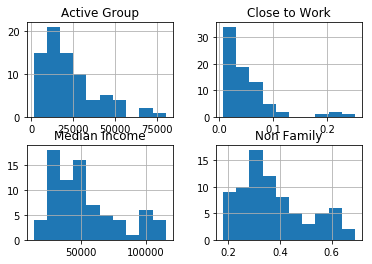

In [84]:
viz = df_chicago[['Median Income','Active Group','Close to Work','Non Family']]
viz.hist()
plt.show()

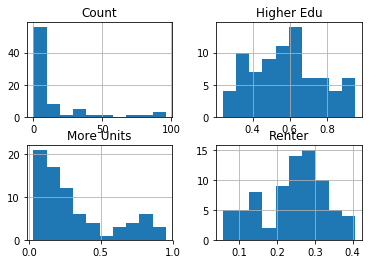

In [85]:
viz = df_chicago[['Higher Edu','Renter','More Units','Count']]
viz.hist()
plt.show()

In [86]:
df_chicago.corr(method='pearson')

,Median Income,Active Group,Close to Work,Non Family,Higher Edu,Renter,More Units,Count
Median Income,1.000000,0.377615,0.370751,0.285801,0.692059,-0.479654,0.177699,0.610092
Active Group,0.377615,1.000000,0.358825,0.376885,0.313220,0.192357,0.326218,0.710672
Close to Work,0.370751,0.358825,1.000000,0.675814,0.584201,0.354445,0.720833,0.727439
Non Family,0.285801,0.376885,0.675814,1.000000,0.746269,0.449275,0.847255,0.695049
Higher Edu,0.692059,0.313220,0.584201,0.746269,1.000000,0.020593,0.643480,0.652076
Renter,-0.479654,0.192357,0.354445,0.449275,0.020593,1.000000,0.592517,0.191009
More Units,0.177699,0.326218,0.720833,0.847255,0.643480,0.592517,1.000000,0.588706
Count,0.610092,0.710672,0.727439,0.695049,0.652076,0.191009,0.588706,1.000000


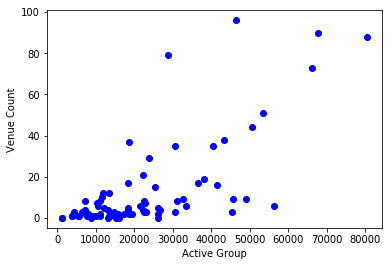

In [87]:
plt.scatter(df_chicago['Active Group'], df_chicago.Count,  color='blue')
plt.xlabel("Active Group")
plt.ylabel("Venue Count")
plt.show()

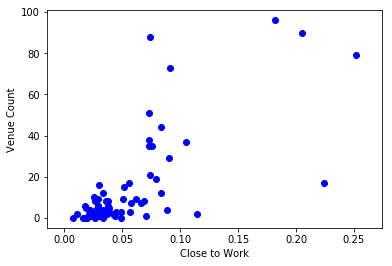

In [88]:
plt.scatter(df_chicago['Close to Work'], df_chicago.Count,  color='blue')
plt.xlabel("Close to Work")
plt.ylabel("Venue Count")
plt.show()

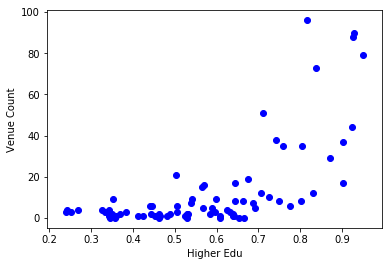

In [89]:
plt.scatter(df_chicago['Higher Edu'], df_chicago.Count,  color='blue')
plt.xlabel("Higher Edu")
plt.ylabel("Venue Count")
plt.show()

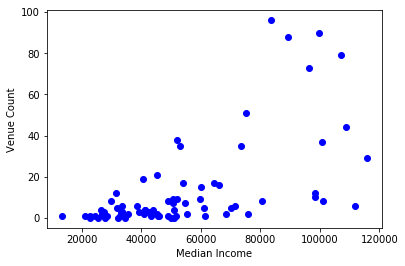

In [106]:
plt.scatter(df_chicago['Median Income'], df_chicago.Count,  color='blue')
plt.xlabel("Median Income")
plt.ylabel("Venue Count")
plt.show()

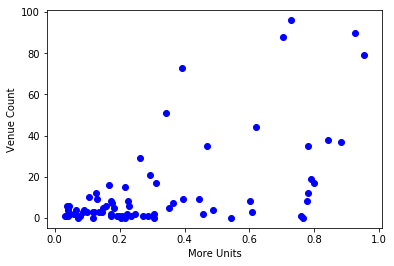

In [107]:
plt.scatter(df_chicago['More Units'], df_chicago.Count,  color='blue')
plt.xlabel("More Units")
plt.ylabel("Venue Count")
plt.show()

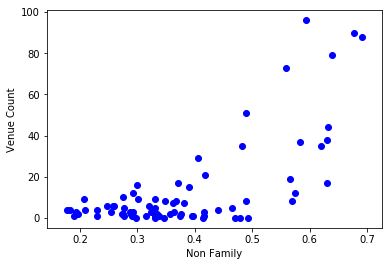

In [108]:
plt.scatter(df_chicago['Non Family'], df_chicago.Count,  color='blue')
plt.xlabel("Non Family")
plt.ylabel("Venue Count")
plt.show()

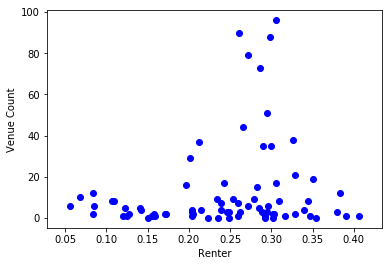

In [109]:
plt.scatter(df_chicago['Renter'], df_chicago.Count,  color='blue')
plt.xlabel("Renter")
plt.ylabel("Venue Count")
plt.show()

In [90]:
df_nocandi=df_chicago[~df_chicago['Community'].isin(['WEST TOWN','ROGERS PARK','ALBANY PARK'])]
df_nocandi

,Community,Median Income,Active Group,Close to Work,Non Family,Higher Edu,Renter,More Units,Count
1,ARCHER HEIGHTS,44108.84007,7242.552685,0.033225,0.230125,0.342306,0.204073,0.039665,4.0
2,ARMOUR SQUARE,27463.83031,7606.191531,0.114301,0.356499,0.350517,0.302179,0.457145,2.0
3,ASHBURN,68463.73500,26187.999992,0.011158,0.197522,0.532218,0.083445,0.042905,2.0
4,AUBURN GRESHAM,34661.22650,26151.000004,0.026618,0.346228,0.529572,0.248322,0.217234,0.0
5,AUSTIN,33419.90397,56437.000000,0.028705,0.320584,0.445124,0.271969,0.229839,6.0
6,AVALON PARK,43372.93830,5368.225150,0.028898,0.415767,0.607657,0.154982,0.172626,1.0
7,AVONDALE,60000.00000,25489.999997,0.051406,0.389595,0.563989,0.282648,0.215986,15.0
8,BELMONT CRAGIN,50767.45194,49151.563040,0.028645,0.207672,0.351465,0.233627,0.129504,9.0
9,BEVERLY,98415.94828,11966.000003,0.033313,0.292667,0.829753,0.084295,0.128023,12.0
10,BRIDGEPORT,50579.58519,22691.808472,0.057407,0.381651,0.538188,0.260137,0.176843,7.0


In [91]:
df_nocandi.corr(method='pearson')

,Median Income,Active Group,Close to Work,Non Family,Higher Edu,Renter,More Units,Count
Median Income,1.000000,0.348840,0.365791,0.278445,0.689543,-0.503170,0.189910,0.593451
Active Group,0.348840,1.000000,0.342904,0.340964,0.278296,0.164698,0.314803,0.685223
Close to Work,0.365791,0.342904,1.000000,0.671680,0.576835,0.345570,0.724985,0.736766
Non Family,0.278445,0.340964,0.671680,1.000000,0.740838,0.434646,0.851170,0.692396
Higher Edu,0.689543,0.278296,0.576835,0.740838,1.000000,0.002366,0.650604,0.640805
Renter,-0.503170,0.164698,0.345570,0.434646,0.002366,1.000000,0.579020,0.179369
More Units,0.189910,0.314803,0.724985,0.851170,0.650604,0.579020,1.000000,0.616756
Count,0.593451,0.685223,0.736766,0.692396,0.640805,0.179369,0.616756,1.000000


In [92]:
df_nocandi.drop(['Close to Work','Renter'],axis=1, inplace=True)
df_nocandi

/home/nbuser/anaconda3_420/lib/python3.5/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


,Community,Median Income,Active Group,Non Family,Higher Edu,More Units,Count
1,ARCHER HEIGHTS,44108.84007,7242.552685,0.230125,0.342306,0.039665,4.0
2,ARMOUR SQUARE,27463.83031,7606.191531,0.356499,0.350517,0.457145,2.0
3,ASHBURN,68463.73500,26187.999992,0.197522,0.532218,0.042905,2.0
4,AUBURN GRESHAM,34661.22650,26151.000004,0.346228,0.529572,0.217234,0.0
5,AUSTIN,33419.90397,56437.000000,0.320584,0.445124,0.229839,6.0
6,AVALON PARK,43372.93830,5368.225150,0.415767,0.607657,0.172626,1.0
7,AVONDALE,60000.00000,25489.999997,0.389595,0.563989,0.215986,15.0
8,BELMONT CRAGIN,50767.45194,49151.563040,0.207672,0.351465,0.129504,9.0
9,BEVERLY,98415.94828,11966.000003,0.292667,0.829753,0.128023,12.0
10,BRIDGEPORT,50579.58519,22691.808472,0.381651,0.538188,0.176843,7.0


In [93]:
msk = np.random.rand(len(df_nocandi)) < 0.8
train = df_nocandi[msk]
test = df_nocandi[~msk]

In [94]:
from sklearn import linear_model
regr = linear_model.LinearRegression()
x = np.asanyarray(train[['Median Income','Active Group','Non Family','Higher Edu','More Units']])
y = np.asanyarray(train[['Count']])
regr.fit (x, y)
# The coefficients
print ('Coefficients: ', regr.coef_)

Coefficients:  [[ 2.34138277e-04  5.06717086e-04  6.88969721e+01 -6.21441736e+00
   1.39846732e-01]]


In [95]:
y_hat= regr.predict(test[['Median Income','Active Group','Non Family','Higher Edu','More Units']])
x = np.asanyarray(test[['Median Income','Active Group','Non Family','Higher Edu','More Units']])
y = np.asanyarray(test[['Count']])
print("Residual sum of squares: %.2f"
      % np.mean((y_hat - y) ** 2))

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % regr.score(x, y))

Residual sum of squares: 283.45
Variance score: 0.72


In [96]:
candidates=df_chicago[df_chicago['Community'].isin(['WEST TOWN','ROGERS PARK','ALBANY PARK'])]
candidates

,Community,Median Income,Active Group,Close to Work,Non Family,Higher Edu,Renter,More Units,Count
0,ALBANY PARK,59883.04094,32595.999976,0.051012,0.331214,0.542158,0.279288,0.394359,9.0
60,ROGERS PARK,40590.68220,38199.000013,0.079482,0.566028,0.674122,0.350353,0.790377,19.0
75,WEST TOWN,96499.01380,66100.000000,0.091332,0.559161,0.836283,0.286059,0.391546,73.0


In [97]:
y_westtown=regr.predict(np.asanyarray(candidates[['Median Income','Active Group','Non Family','Higher Edu','More Units']]))
y_westtown

array([[15.6530045 ],
       [29.38829732],
       [55.07993113]])

In [98]:
gymlist=['Gym/Fitness Center','Gym']
chicago_venues2=chicago_venues[chicago_venues['Venue Category'].isin(gymlist)]
chicago_venues2

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
101,Austin,41.900,-87.7600,Tennis And Fitness Center,41.888046,-87.783444,Gym
103,Austin,41.900,-87.7600,YMCA,41.889375,-87.764858,Gym
162,Avondale,41.9400,-87.7100,Victory Training,41.943400,-87.683913,Gym
223,Beverly,41.7100,-87.6800,Evergreen Raquet And Fitness,41.728687,-87.688423,Gym
282,Brighton Park,41.8200,-87.7000,Focal Point Fitness Center,41.817385,-87.722196,Gym
317,Chicago Loop,41.88194,-87.62778,Fitness Formula Club (FFC),41.878074,-87.638632,Gym
368,Chicago Loop,41.88194,-87.62778,Silversmith Hotel and Suites/Gym,41.881844,-87.626350,Gym
369,Chicago Loop,41.88194,-87.62778,Dev's Gym,41.881112,-87.626631,Gym
380,Chicago Loop,41.88194,-87.62778,Lifestart at 77 W wacker,41.885983,-87.630709,Gym
382,Chicago Loop,41.88194,-87.62778,LifeStart,41.882415,-87.634339,Gym


In [99]:
chicago_venues2.count()

Neighborhood              346
Neighborhood Latitude     346
Neighborhood Longitude    346
Venue                     346
Venue Latitude            346
Venue Longitude           346
Venue Category            346
dtype: int64

In [100]:
Namelist2=[]
Vcount2=[]
for i in range(len(dfinal['Community'])):
       lons_lats_vect=communities_json['features'][i]['geometry']['coordinates'][0][0]
       polygon = Polygon(lons_lats_vect)
       Namelist2.append(communities_json['features'][i]['properties']['community'])
       n=0
       for r in range(len(chicago_venues2['Neighborhood'])):
            point = Point(chicago_venues2.iloc[r,5],chicago_venues2.iloc[r,4])
            if polygon.contains(point)==True:
                n=n+(r+1)/(r+1)
       Vcount2.append(n)    
print(Namelist2)
print(Vcount2)

['DOUGLAS', 'OAKLAND', 'FULLER PARK', 'GRAND BOULEVARD', 'KENWOOD', 'LINCOLN SQUARE', 'WASHINGTON PARK', 'HYDE PARK', 'WOODLAWN', 'ROGERS PARK', 'JEFFERSON PARK', 'FOREST GLEN', 'NORTH PARK', 'ALBANY PARK', 'PORTAGE PARK', 'IRVING PARK', 'DUNNING', 'MONTCLARE', 'BELMONT CRAGIN', 'WEST RIDGE', 'HERMOSA', 'AVONDALE', 'LOGAN SQUARE', 'HUMBOLDT PARK', 'WEST TOWN', 'AUSTIN', 'WEST GARFIELD PARK', 'EAST GARFIELD PARK', 'NEAR WEST SIDE', 'NORTH LAWNDALE', 'UPTOWN', 'SOUTH LAWNDALE', 'LOWER WEST SIDE', 'NEAR SOUTH SIDE', 'ARMOUR SQUARE', 'NORWOOD PARK', 'NEAR NORTH SIDE', 'LOOP', 'SOUTH SHORE', 'CHATHAM', 'AVALON PARK', 'SOUTH CHICAGO', 'BURNSIDE', 'MCKINLEY PARK', 'LAKE VIEW', 'CALUMET HEIGHTS', 'ROSELAND', 'NORTH CENTER', 'PULLMAN', 'SOUTH DEERING', 'EAST SIDE', 'WEST PULLMAN', 'RIVERDALE', 'HEGEWISCH', 'GARFIELD RIDGE', 'ARCHER HEIGHTS', 'BRIGHTON PARK', 'BRIDGEPORT', 'NEW CITY', 'WEST ELSDON', 'GAGE PARK', 'CLEARING', 'WEST LAWN', 'CHICAGO LAWN', 'WEST ENGLEWOOD', 'ENGLEWOOD', 'GREATER GRA

In [101]:
venuecount2=pd.DataFrame({'Community':Namelist2,'Count':Vcount2})
venuecount2.sort_values('Community',axis=0,inplace=True)
venuecount2=venuecount2.reset_index(drop=True)
venuecount2

,Community,Count
0,ALBANY PARK,4.0
1,ARCHER HEIGHTS,1.0
2,ARMOUR SQUARE,1.0
3,ASHBURN,0.0
4,AUBURN GRESHAM,0.0
5,AUSTIN,1.0
6,AVALON PARK,0.0
7,AVONDALE,8.0
8,BELMONT CRAGIN,3.0
9,BEVERLY,1.0


In [102]:
venuecount2.Count.sum()

330.0

In [103]:
venuecount2=venuecount2.set_index('Community')
venuecount2.rename(index={'OHARE':'O\'HARE'}, inplace=True)
venuecount2.reset_index(inplace=True)
venuecount2

,Community,Count
0,ALBANY PARK,4.0
1,ARCHER HEIGHTS,1.0
2,ARMOUR SQUARE,1.0
3,ASHBURN,0.0
4,AUBURN GRESHAM,0.0
5,AUSTIN,1.0
6,AVALON PARK,0.0
7,AVONDALE,8.0
8,BELMONT CRAGIN,3.0
9,BEVERLY,1.0


In [104]:
df_chicago2=df_sum.merge(venuecount2,on='Community',how='inner')
df_chicago2.shape

(77, 9)

In [105]:
df_chicago2.corr(method='pearson')

,Median Income,Active Group,Close to Work,Non Family,Higher Edu,Renter,More Units,Count
Median Income,1.000000,0.377615,0.370751,0.285801,0.692059,-0.479654,0.177699,0.599268
Active Group,0.377615,1.000000,0.358825,0.376885,0.313220,0.192357,0.326218,0.663557
Close to Work,0.370751,0.358825,1.000000,0.675814,0.584201,0.354445,0.720833,0.777078
Non Family,0.285801,0.376885,0.675814,1.000000,0.746269,0.449275,0.847255,0.694509
Higher Edu,0.692059,0.313220,0.584201,0.746269,1.000000,0.020593,0.643480,0.642867
Renter,-0.479654,0.192357,0.354445,0.449275,0.020593,1.000000,0.592517,0.180757
More Units,0.177699,0.326218,0.720833,0.847255,0.643480,0.592517,1.000000,0.609006
Count,0.599268,0.663557,0.777078,0.694509,0.642867,0.180757,0.609006,1.000000


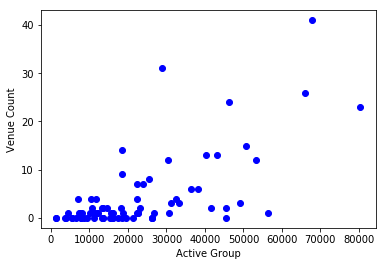

In [106]:
plt.scatter(df_chicago2['Active Group'], df_chicago2.Count,  color='blue')
plt.xlabel("Active Group")
plt.ylabel("Venue Count")
plt.show()

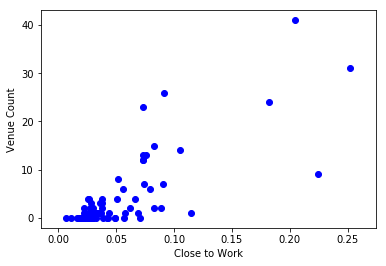

In [107]:
plt.scatter(df_chicago2['Close to Work'], df_chicago2.Count,  color='blue')
plt.xlabel("Close to Work")
plt.ylabel("Venue Count")
plt.show()

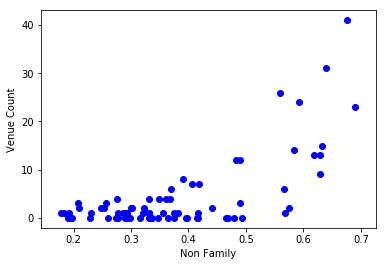

In [108]:
plt.scatter(df_chicago2['Non Family'], df_chicago2.Count,  color='blue')
plt.xlabel("Non Family")
plt.ylabel("Venue Count")
plt.show()

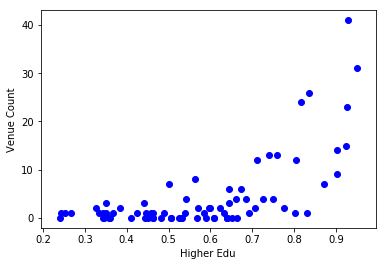

In [109]:
plt.scatter(df_chicago2['Higher Edu'], df_chicago2.Count,  color='blue')
plt.xlabel("Higher Edu")
plt.ylabel("Venue Count")
plt.show()

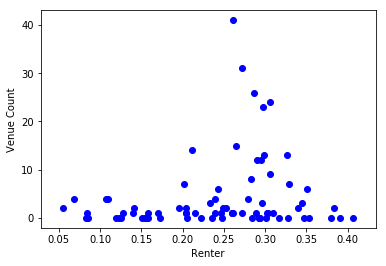

In [110]:
plt.scatter(df_chicago2['Renter'], df_chicago2.Count,  color='blue')
plt.xlabel("Renter")
plt.ylabel("Venue Count")
plt.show()

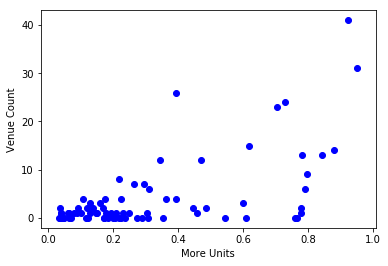

In [111]:
plt.scatter(df_chicago2['More Units'], df_chicago2.Count,  color='blue')
plt.xlabel("More Units")
plt.ylabel("Venue Count")
plt.show()

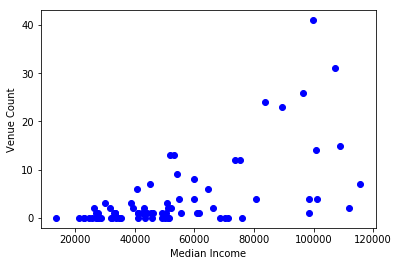

In [112]:
plt.scatter(df_chicago2['Median Income'], df_chicago2.Count,  color='blue')
plt.xlabel("Median Income")
plt.ylabel("Venue Count")
plt.show()

In [113]:
df_nocandi2=df_chicago2[~df_chicago2['Community'].isin(['WEST TOWN','ROGERS PARK','ALBANY PARK'])]
df_nocandi2.drop(['Close to Work','Renter'],axis=1, inplace=True)
df_nocandi2

/home/nbuser/anaconda3_420/lib/python3.5/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


,Community,Median Income,Active Group,Non Family,Higher Edu,More Units,Count
1,ARCHER HEIGHTS,44108.84007,7242.552685,0.230125,0.342306,0.039665,1.0
2,ARMOUR SQUARE,27463.83031,7606.191531,0.356499,0.350517,0.457145,1.0
3,ASHBURN,68463.73500,26187.999992,0.197522,0.532218,0.042905,0.0
4,AUBURN GRESHAM,34661.22650,26151.000004,0.346228,0.529572,0.217234,0.0
5,AUSTIN,33419.90397,56437.000000,0.320584,0.445124,0.229839,1.0
6,AVALON PARK,43372.93830,5368.225150,0.415767,0.607657,0.172626,0.0
7,AVONDALE,60000.00000,25489.999997,0.389595,0.563989,0.215986,8.0
8,BELMONT CRAGIN,50767.45194,49151.563040,0.207672,0.351465,0.129504,3.0
9,BEVERLY,98415.94828,11966.000003,0.292667,0.829753,0.128023,1.0
10,BRIDGEPORT,50579.58519,22691.808472,0.381651,0.538188,0.176843,1.0


In [114]:
msk2 = np.random.rand(len(df_nocandi2)) < 0.8
train2 = df_nocandi2[msk2]
test2 = df_nocandi2[~msk2]

In [115]:

regr2 = linear_model.LinearRegression()
x2 = np.asanyarray(train2[['Median Income','Active Group','Non Family','Higher Edu','More Units']])
y2 = np.asanyarray(train2[['Count']])
regr2.fit (x2, y2)
# The coefficients
print ('Coefficients: ', regr.coef_)

Coefficients:  [[ 2.34138277e-04  5.06717086e-04  6.88969721e+01 -6.21441736e+00
   1.39846732e-01]]


In [116]:
y_hat2= regr2.predict(test2[['Median Income','Active Group','Non Family','Higher Edu','More Units']])
x2 = np.asanyarray(test2[['Median Income','Active Group','Non Family','Higher Edu','More Units']])
y2 = np.asanyarray(test2[['Count']])
print("Residual sum of squares: %.2f"
      % np.mean((y_hat2 - y2) ** 2))

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % regr.score(x, y))

Residual sum of squares: 14.33
Variance score: 0.72


In [117]:
regr3 = linear_model.LinearRegression()
x3 = np.asanyarray(df_nocandi2[['Median Income','Active Group','Non Family','Higher Edu','More Units']])
y3 = np.asanyarray(df_nocandi2[['Count']])
regr3.fit (x3, y3)
# The coefficients
print ('Coefficients: ', regr.coef_)

Coefficients:  [[ 2.34138277e-04  5.06717086e-04  6.88969721e+01 -6.21441736e+00
   1.39846732e-01]]


In [118]:
candidates2=df_chicago2[df_chicago2['Community'].isin(['WEST TOWN','ROGERS PARK','ALBANY PARK'])]
candidates2

,Community,Median Income,Active Group,Close to Work,Non Family,Higher Edu,Renter,More Units,Count
0,ALBANY PARK,59883.04094,32595.999976,0.051012,0.331214,0.542158,0.279288,0.394359,4.0
60,ROGERS PARK,40590.68220,38199.000013,0.079482,0.566028,0.674122,0.350353,0.790377,6.0
75,WEST TOWN,96499.01380,66100.000000,0.091332,0.559161,0.836283,0.286059,0.391546,26.0


In [119]:
y_predict=regr3.predict(np.asanyarray(candidates2[['Median Income','Active Group','Non Family','Higher Edu','More Units']]))
y_predict

array([[ 6.57509365],
       [11.72895843],
       [18.83605999]])

### The End.